In [6]:
%autosave 0

Autosave disabled


In [2]:
import pandas as pd
import numpy as np
import spacy
import nltk
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
import re
from tqdm import tqdm
import time

import matplotlib.pyplot as plt
%matplotlib inline

from utils import *

Prepare topic phrase and stemmer

In [3]:
DATAPATH = "data/topic_phrases.txt" #change me
topic_phrases = pd.read_table(DATAPATH, sep = "|")

In [10]:
print(len(topic_phrases))
print(topic_phrases.head())
topic_words = set(topic_phrases['phrase'])

7555
     topic           phrase
0  alcohol     abus alcohol
1  alcohol     alcohol abus
2  alcohol  alcohol beverag
3  alcohol  alcohol content
4  alcohol     alcohol drug


In [13]:
ps = PorterStemmer()

## [DELETE] 
direc = "data/hein-bound"
filepath = os.path.join(direc, "{}".format(get_speeches_filename(109))) #Change Me
speech_df = read_full_speech(filepath)

filepath = os.path.join(direc, "{}".format(get_speakermap_filename(109)))#Change Me
speaker_df = read_speakermap(filepath)

final_df = merge_speech_speaker(speech_df, speaker_df)
final_df.head()

Get answers or questions that contain at least one phrase from the set of topic words

no = 0
for i in range(len(final_df)):
    # change comma for both question speech and answer speech
    question = change_comma(final_df.iloc[i].speech)
    # tokenize speeches
    quest_sents = nltk.sent_tokenize(question)
    # stem answer
    stemmed_a = [ps.stem(w.lower()) for sent in quest_sents for w in word_tokenize(sent)]
    stemmed_ans = ' '.join(stemmed_a)
    if any(phrase in stemmed_ans for phrase in topic_words):
        #print("Answer: ", question)
        #print("Party: ", final_df.iloc[i].party)
        #print()
        no += 1
        
print("Number of speeches identified: ", no)
df.to_pickle("all_speeches.pkl")

#### Get questions and answers from all years

In [15]:
start_time = time.time()

questions = []
parties = []
for i in range(43, 106):  #final range?
    edition = str(i).zfill(3)
    no = 0

    # read speeches 
    speech_df = read_full_speech(get_speeches_filename(edition))
    #with open("{}".format(get_speeches_filename(edition)), errors="ignore") as f:
        #speech = f.readlines()
        #speech = [s.strip() for s in speech]
        #speech = [[s[:s.find('|')], s[s.find('|')+1:]] for s in speech]
        #speech_df = pd.DataFrame(speech[1:])
        
    df_merged = pd.concat([speech_df, speech_df.shift(-1).add_prefix('next_')], axis=1)

    for j in tqdm(range(len(speech_df))):
        # change comma in speech (OCR error) 
        question = change_comma(str(speech_df.iloc[j].speech))
        # tokenize question speech
        quest_sents = nltk.sent_tokenize(question)
        # select question sentences from speech
        quests = [q for q in quest_sents if True]
        party=speech_df.iloc[j].party
        for q in quests:
            words = word_tokenize(q)
            words = [ps.stem(w.lower()) for w in words]
            stemmed_q = ' '.join(words)
            if any(phrase in stemmed_q for phrase in topic_words) and len(quest_sents) == 1:
                questions.append(q)
                parties.append(party)
                no += 1
                
    print("finished file {}. {} pairs found".format(edition, no))
df = pd.DataFrame(list(zip(questions,parties)), columns =['Questions', 'Party'])

elapsed_time = time.time() - start_time
time.strftime("%H:%M:%S", time.gmtime(elapsed_time))

100%|█████████████████████████████████████████████████████████████████████████| 119302/119302 [14:49<00:00, 134.16it/s]


finished file 043. 1977 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 114780/114780 [13:48<00:00, 138.48it/s]


finished file 044. 2113 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 134785/134785 [13:42<00:00, 163.94it/s]


finished file 045. 2558 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 174568/174568 [17:02<00:00, 170.79it/s]


finished file 046. 2873 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 205609/205609 [20:14<00:00, 169.31it/s]


finished file 047. 4400 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 140365/140365 [13:55<00:00, 167.98it/s]


finished file 048. 2701 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 162083/162083 [16:30<00:00, 163.57it/s]


finished file 049. 3440 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 187283/187283 [17:51<00:00, 174.81it/s]


finished file 050. 4187 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 232698/232698 [22:42<00:00, 170.73it/s]


finished file 051. 5298 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 154496/154496 [13:49<00:00, 186.34it/s]


finished file 052. 3463 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 228407/228407 [22:38<00:00, 168.12it/s]


finished file 053. 5736 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 149453/149453 [14:13<00:00, 175.07it/s]


finished file 054. 3292 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 195024/195024 [18:40<00:00, 174.03it/s]


finished file 055. 5391 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 155754/155754 [15:09<00:00, 171.20it/s]


finished file 056. 4254 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 134113/134113 [13:39<00:00, 163.65it/s]


finished file 057. 3588 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 124478/124478 [11:57<00:00, 173.58it/s]


finished file 058. 3158 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 184897/184897 [16:34<00:00, 185.85it/s]


finished file 059. 5416 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 155293/155293 [13:01<00:00, 198.62it/s]


finished file 060. 4369 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 279720/279720 [23:16<00:00, 200.24it/s]


finished file 061. 9059 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 340160/340160 [28:15<00:00, 200.60it/s]


finished file 062. 9406 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 465818/465818 [41:20<00:00, 187.77it/s]


finished file 063. 11812 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 311591/311591 [30:50<00:00, 168.36it/s]


finished file 064. 9034 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 419213/419213 [38:20<00:00, 182.22it/s]


finished file 065. 12651 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 350080/350080 [32:51<00:00, 177.56it/s]


finished file 066. 9882 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 416511/416511 [38:30<00:00, 180.26it/s]


finished file 067. 13778 pairs found


100%|█████████████████████████████████████████████████████████████████████████| 222149/222149 [20:14<00:00, 182.98it/s]


finished file 068. 6800 pairs found


 15%|██████████▊                                                               | 36024/247037 [03:28<18:28, 190.30it/s]

KeyboardInterrupt: 

In [ ]:
print(len(df))

In [ ]:
df.to_pickle("all_speeches.pkl")

In [33]:
df.head(15)

,Questions,Answers
0,Will the Senator allow me right there to ask h...,I will lot the Senator hear what Mr. Benjamin ...
1,"Will the Senator allow me just one momont, as ...","In examining all the evidence in this case, I ..."
2,Will mycolleague state how many committees wer...,This resolution authorizes the committees to e...
3,I noltorstaid oy friend from Ohio to say that ...,I desire to ask the gentleman one question mor...
4,I wish to ask the gentleman from Massachusetts...,In a country that prides itself upon the simpl...
5,My colleague seems to favor a retroactive prov...,I am.
6,I would ask the gentleman if we have any recom...,We have no recommendation of record. When the ...
7,"Well, do I understand that, stippositig the Se...","Yes, sir, it will be contendoed on the other s..."
8,Does the language of this bill in any way bind...,The language of the act to which this is an am...
9,I understand the Senator to say that wlin the ...,Unquestionably it would. Governientscannotbo o...


In [36]:
for i in range(5):
    print("Question: ", df.iloc[i].Questions)
    print()

Question:  Will the Senator allow me right there to ask him what power a State legislature has in sut a case, whether it has the power to snake an investigation, and, if it finds that there was bribery, has it the power to annul the election of a Senator ?
Answer:  I will lot the Senator hear what Mr. Benjamin said first, because I have some confidence in that: That their complaint will meet the respectful consideration of that house, your committee are net permitted to doubt. If upon such investigation the facts charged are proven and if they, in any manner, involve the character of the reesetyeletel member of this body fre1 the State of Pennsylvania, the Constitution 6f the United States has not left the Senate without ample means for protect, ing itself against the presence of unworthy members in its midst. What clause of the Constitution? The clause relative to elections? No, sir. If that case is a precedent, if the action of the democratic party when it was in power, dealing with 

### Dataset Analysis

In [2]:
df = pd.read_pickle("question_answer_pairs.pkl")

In [8]:
no_sentences = []
for i in range(len(df)):
    answer = df.iloc[i].question
    sents = nltk.sent_tokenize(answer)
    no_sentences.append(len(sents))

(array([2.1923e+04, 1.0642e+04, 5.9070e+03, 3.7290e+03, 2.5300e+03,
        1.6880e+03, 1.2200e+03, 9.4800e+02, 7.6000e+02, 6.2400e+02,
        4.6500e+02, 4.5200e+02, 3.4100e+02, 3.2100e+02, 2.5500e+02,
        2.6700e+02, 2.0800e+02, 1.8900e+02, 1.8100e+02, 1.4600e+02,
        1.2800e+02, 1.2100e+02, 1.2100e+02, 9.8000e+01, 8.8000e+01,
        1.0500e+02, 8.5000e+01, 6.5000e+01, 8.3000e+01, 6.6000e+01,
        7.7000e+01, 6.2000e+01, 6.1000e+01, 7.0000e+01, 3.8000e+01,
        4.6000e+01, 5.0000e+01, 4.6000e+01, 3.4000e+01, 3.1000e+01,
        3.8000e+01, 3.1000e+01, 3.8000e+01, 2.9000e+01, 2.7000e+01,
        2.4000e+01, 1.4000e+01, 2.2000e+01, 1.5000e+01, 0.0000e+00,
        1.6000e+01, 2.1000e+01, 2.0000e+01, 1.4000e+01, 2.0000e+01,
        1.3000e+01, 1.3000e+01, 1.4000e+01, 1.4000e+01, 1.7000e+01,
        1.0000e+01, 1.4000e+01, 7.0000e+00, 1.1000e+01, 1.1000e+01,
        1.1000e+01, 4.0000e+00, 5.0000e+00, 9.0000e+00, 1.2000e+01,
        5.0000e+00, 1.2000e+01, 9.0000e+00, 8.00

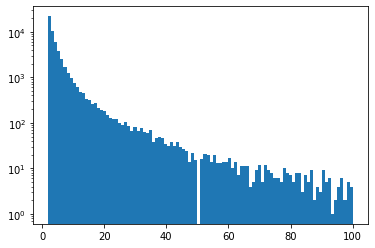

In [20]:
plt.hist(no_sentences, bins=100, range=(2, 100), log=True);

In [3]:
#filter out answers with a single sentence and very long answers
new_df = df[df.apply(lambda x: len(nltk.sent_tokenize(x['Questions'])) > 1 and len(nltk.sent_tokenize(x['Questions'])) < 50, axis=1)] 

In [4]:
len(new_df)

54494

In [5]:
for i in range(5000):
    print("Answer: ", new_df.iloc[i].Answers)
    print()

Question:  Will mycolleague state how many committees were authorized to emldoy clerks at the last session of Congress ?
Answer:  This resolution authorizes the committees to employ clerks which were allowed to employ clerks during the Fortysecond Congress. The resolution was adopted.

Question:  I noltorstaid oy friend from Ohio to say that he was opposed to this back pay because it was too munch, I want that lie slil1 tell us how much back pay li would go for?
Answer:  I desire to ask the gentleman one question more, and lie can mnswer all together. He says in the Congress of 1866 every member took the back pay, and that is the reason he took it.

Question:  I wish to ask the gentleman from Massachusetts, as the leader of the House, and the chairman of the chief financial committee of the House, whether in his judgment, leaving the voice of tie people aside for a moment, whether in his own jud.meat, as a member of the House, he considers the salary of $10i.000 and inordinate and extr


Question:  What has become of the House bill in regard to the Pacific railroads?
Answer:  pro tempers. It was cut off by the expiration of the da yesterday.

Question:  What is the amount of duties collected?
Answer:  I cannot tell. Sandusky is not so important by far as Cleveland, the chief port of entry, I can say to the Senator that it is very large at Sandusky, because it is the terminus of two large railroads running through the State of Ohio.

Question:  Is not the debtor injured by that appreciation which has been brought about by foreign nations throwing silverout of the money of the world?
Answer:  I understand your question. Mr. Speaker, it will be after all but an individual opinion, an approximate opinion, and if my individual opinion is worth anything to my friend from Illinois I am very glad to give it to him.

Question:  Has the Government taken it in band?
Answer:  The Govertment is proposing to take it in hand by the paragraph sent us by the House and even by the amen

Answer:  Not that I know of, I do not know that it is necessary that the Railroad Committee should consider it. During the course of the session various bills were by the Senate referred to the Judiciary Committee on the subject of what is called the " prorating " of freights and passengers over the roads that were constructed under the acts of 1862 and 1864 for the purpose of completing a railroad and telegraph line from the Missouri River to the Pacific Ocean. The bills that were referred to the Judiciary Committee on that subject were numerous, and some of them very complicated. After having given such consideration to those measures as the committee could, we became satisfied that we did not possess the information, and we were satisfied that the information- was not in the possession of the Senate or accessible to it, upon which intelligent legislation could take place. The act of 1864 declared that these several roads should be operated as one line, and that there should be no un

Answer:  pr toupore. It was. The gentleman from New York now moves that the morning hour be dispensed with.

Question:  Before the gentleman takes his seat I would like to inquire of him, as I did of the gentlemanfrom Illinois, what provision in this second section, or in any other section of the bill, would confer upon this court jurisdiction of that class of cases, if the clause is stricken out which the gentleman from Tennessee moves to strike out ?
Answer:  If I do not trespass too much upon the time of the committee I will endeavor to answer the gentleman. In the first place, let us look at this section, because we want to do right all around, that is what I am for. It shall be the duty of sai court to examine and determine all claims fer pensions, increase of pesns, for restoratien to the pension rolls, and for arrears of pensions, arising uder the laws of the United States which may be appealed tott froma the Cimmasionor or Pensions, I shouldwant to insert after thosewordsthe wo


Question:  And persons who had gold regarded the silver certificates as good as gold to the amount of $70.00.000 ?
Answer:  I stated the answer to that suggestion in this way: that at that time there was a great demand for currency. The silver certificates were receivable in paymnent of public dues. The person who received the silver certificates in the first instance (lid not care at all what they were payable in. He would have taken any kind of money that would enable him to buy wheat and cotton and the products of the country. At that time they were maintained by the Government and are to this day at a gold standard, and, as a matter of course, all persons received them as money that they could use as the equivalent of gold. The question of their future redemption, or whether they would be redeemed or not in "ldwas, as a matter of course, a matter of indifference to them tben, the same time, I will say that not a dollar of silver certificates was issued except when there was a silv

Question:  I should like to ask the Senator from Delaware a question, I do not have the book before me, but is the rate that lie proposes on galvanized iron the rate fixed by the Tariff Commission?
Answer:  I can scarcely tell the Senator. The reason I offer the amendment is that I can scarcely find in the bill any allocation for this item, I think this class of manufactures has simply been elbowed out by those who had the preparation of the iron schedule, and part of my reason for offering it is that I wish to see fair play about it.

Question:  Do I understand the Senator to say that rice requires skilled labor of a higher character than is required in the cultivation of rye or other grain in the North?
Answer:  Not of a higher character, but still the labor must be skilled in that business. It requires an amount of preparation that is not required in wheatland or in any other land where you grow grain on in this country, and there is a cost about it that is a very heavy cost. It cos

Question:  I understood the gentleman to say that in order to pay the large amount of pensions that might be required by passing this bill he was in favor of having an income tax imposed in this country, I would like to ask him first whether he is in lhvor of such a tax as that, and, secondly, whether in his judgmenst the increase of pensions provided by this bill would require an increase of taxation in this country?
Answer:  I answer the first question by saying unhesitatinglyyes. If my record had been of sufficient consequence to have attracted the attention of the gentleman, lie would have known that I have put myself on record as in favor of that kind of tax when.ever the necessities of the Government required it. To the second question, I answer that I do not believe it will be necessary to resort to any further taxation beyond that which now exists in order to pay this increased pensionroll.

Question:  Can the Senator in that connection state also what will be the aggregate of 

Question:  I ask the Senator from Kansas if he does not know that every dollar paid to witnesses and jurors has to be paid upon the certificate of the judges of the courts, and that the AttorneyGeneral can not refuse to have the money paid when the certificates come in ?
Answer:  B. Is that any more true now than it was last year or the year befbre?

Question:  I want to ask the gentleman from Arkansas if he considers that it is throwing the door wide open to allow pensions to men who were shot down in battle under the command of an officer of the United States Government in the defense of the Union?
Answer:  Mr. Chairman, that is not the question presented here at all. These people have had their day in court, and they let it pass by. We had fixed a limitation for these cases. The very object of all statutes of limitation is to fix a time when society shall have rest and reDose. The question is, shall we disturb that rest now?

Question:  But does not the gentleman know that there is 

Question:  Now, I wish to know if the case of Tiller has been made special in tle Pension Office?
Answer:  I can not say as to that. The case has been reopened. Only two simple points are involved, and I think all the evidence on both points can be obtained between now and next Friday. It is in the interest of the case that I have asked a postponement.

Question:  I want to know what difference there is in principle between this amendment and the principle of the joint resolution that you introduced yourself paying to the relatives of a deceased officer of this House an entire years pay, when it was well known that that officer had no wife, no child, no mother, and no family, no one, indeed, except a noted lobbyist that infests the corridors of this Capitol?
Answer:  The gentleman from Iowa with his usual logic proposes to criticise the accuracy of my position now by showing that, as he supposes, I was wrong on anotheroccasion. That is about as good logic ats could be expected from a g

Answer:  Some of them are worth more than some Congressmen. [Here the hammer fell.]

Question:  What reason has the gentleman for supposing that the officers of the United States Government who, upon the appointment of the President of the United States, are to make this investigation will make a more thorough investigation than the investigation whichwas made by the officers of the United States who were appointed by the Secretary of State, or will report a different or a better conclusion ?
Answer:  I do not consider that it is material whether they report the same amount or a different amount, I say that this is a business matter, and here are two different propositions, originating in the Senateand in theHouse, respectively, as to the method by which it shall be adjusted, one proposing an investigation and the other not. As to the examples which my friend from New Jersey has quoted, showing the action of China, I do not think they should control here.

Question:  He seemed to make 

Answer:  I answer and say no. Under the rules of this body it would be altogether proper for the Senator from Nebraska to refer to the fact that a veto message of a certain bill had come to the Senate, but it would not be in order for him to undertake to tell what might bappen in the future.

Question:  I would like to inquire whether those miners are in the same condition as the miners in Pennsylvania, whether they are starving under the present protective tariff?
Answer:  The Chair can not answer that question. Is there obj ection to the request of the gentleman from Michigan [Mr.

Question:  In the Indian Territory?
Answer:  Oh, no. In the Indian Territory they have a feesimple title by patent. The Supreme Court has settled the feesimple title there. The Cherokees and Chickasaws and all those tribes hold under a patent issued many years ago, and have a feesimple title, as has been declared by the Supreme Court of the UnitedStates. TheSupreme Court has said that if the restriction th

Question:  I would like to ask how the Navy Department is getting along building guns now?
Answer:  Well, they 4re not getting along rapidly. Government work never does.

Question:  Satisfactorily to the Navy Department or to the Secretary of the Navy?
Answer:  Well, I will not say how satisfactorily the work may be going on to the Navy Department or the country. That is not of consequence. We are not interfering with the Army or the Navy, we are not abridging the powers, the duties, or the opportunities of the Ordnance Bureau. Not a word to that effect is currect. We are giving them all the machinery and plant they ask, and they name the amount required. We are giving them all the money they ask, and they fix the amnount themselves. We aregiving them all the assistance they ask, and they determine what it shall be. We are permitting them to make the guns they say are best, and they select them themselves. We are allowing them to adopt the type of gun which they prefer, which they in p


Question:  Did the Northern Pacific Railroad Company or any other party appear before the committee, by attorney or otherwise, to oppose this bill?
Answer:  They did not, I only state that asan impression which we obtained, I think, from the commission who went out there. But there is another railroad there, I believe, which ends at Pierre. Under this bill if the grant which they have obtained from the Indians is ratified they will have to extend their road to the Black Hills. As I understand it, that company does not now want to extend its line to the Black Hills, because it makes connection with another railroad that reaches the Hills through Nebraska, and so it gets the trade anyway. But if this bill shall pass they will be compelled to extend the line within twelve months. Therefore, of course, they are not in favor of this bill or of any measure opening up this reservation. But the greatest obstacle is found in certain squawmen and certain chiefs who own large herds of cattle and

Answer:  Not asgold certificates, I do not think anything is honest or just but what complies with the contract. When we receive gold from a man we give him a certificate and say to him "we will hold that gold until you return the certificate." Now, if we change the law and let the Government issue a paper circulation based upon its credit and responsibility and promises, then we must reduce the amount of coin necessary to be held far below dollar for dollar. But that is not what the gold certificates and the silver certificates are.

Question:  Did not the Senator say the United States notes would have been just as valuable?
Answer:  I said that without the specific deposit of that $95.500.000 in bonds the United States notes would have been just exactly as valuable. Does the Senator from Massachusetts doubt it? I should like the opinion of an eminent financier of his reputation on that subject. There are one or two observations I should like to make about the statement of the public 

Question:  Then it is a change from an ad valorem to a specific duty?
Answer:  Yes, sir. It is a reduction instead of an increase.

Question:  In making up a tariff upon that basis, did the Senator or the committee take into account, or would he now take into account, that kind of a question on specific inquiry as to the ability of the consumers of these articles to bear the burden of taxation?
Answer:  In my judgmentand my opinions are very decided upon that questionin all cases where an industry may be developed, become thoroughly American, to establish a domestic market, the inevitable effect in all cases is to reduce the price to the consumer. On that question I have no doubt whatever.

Question:  Was that the case of a private soldier or of a soldiers widow?
Answer:  Burns rose from the ranks. He became a brevet brigadiergeneral. More than that, he was a Republican whose popularity in the Democratic city of New York was so great that he was elected aldermanatlarge of that city. He

Answer:  Imade a statement on that point a few moments ago. The gentleman probably was not in his seat.

Question:  Will the gentleman permit me to ask if the Internal Revenue Bureau have been consulted in regard to this?
Answer:  They have been heretofore. They have not been consulted with regard to the preparation of the present bill. The Department of Justice, however, has been in previous Congresses, and has given its assent to the different provisions, many of which have been incorporated at the suggesfion of the AttorneyGeneral.

Question:  Under section 3 every warrant has to be returnable before some judicial officer?
Answer:  Some judicial officer. Mr. REEl). But not a United States judicial officer?

Question:  Then the Government owns that land now?
Answer:  Yes, sir, the Government owns it. They bought it two years ago, I do not think it necessary to say anything more about the gaslight, I do not think it necessary to discuss where this recominendation came from. If it had 

Answer:  No, sir, it leaves that court simply without anybody to perform this duty. If the circuit court of appeals makes a restraining order, there is under this proposition no officer to execute that order. It seems to me this provision defeats, in its effect, the law of 1891, which was not an illconsidered measure, but was passed with due care and deliberation.

Question:  Is there any provision made, where damage to private property is done, that there shall be compensation?
Answer:  Oh, there is no question of that kind. This is simply to meet a requirement of the statute of Obio that street railways shall obtain the consent of abutting propertyowners. It does not grant any right of way at all.

Question:  What State Legislature was that?
Answer:  I have thought it wisest not to particularize in this discussion. It was Mrs Malaprop, I believe, who said that "caparisons is odorous." While I do not desire to mention the State, yet if I am forced under a cloture rule. Mr. Speaker, I 

Answer:  The Senator from South Carolina wants me to open up a question in the middle of the speechof the Senator from Nebraska, I would be quite willing to do it, but I do not propose to do it now. What I intended to saywas that the existence of the Sherman act and the delay in this body of its repeal have produced conditions of apprehension as to the stability of the medium of payment which have deprived the numerous people of whom the Senator from Nebraska has spoken of the opportunity of working for remunerative wages.

Question:  I should like to have the Senator from Kansis, who has evidently studied this matter thoroughly, tell me how a man owning money which is taxed 3 per cent, as the taxes amount to in many of the cities of this countryState, county, municipal, school, and roadcould afford toloan it for 2per cent, and also, if the Government should lend a man 2 per cent money and all the money the country wanted so that would be the ruling rate, how people could afford to bor

Answer:  Having the same quilityof legal tender, the same weight of standard silver, cbntaining exactly the same quantity of pure silver, and the dollars themselves to answer all the purposes that the dollars coined under the act of 1878 can answer. Then the second section of the bill further provides: That as fast as the bullion shall be coined for the redemption of said notesThat is, coined into standard silver dollarsthe notes shall not be reissued, but shall be canceled and destroyed in amounts equal to the coin held at any time in the Treasury, derived fron the coinage therein provided for, and silver certificates shall be Issued on such coin in the manner now provided by law. What law provides for the issue of silver certificates? The act of 1878. Inwhat manner? Upon the depositof legaltender silver dollars. So here the silver certificates shall be issued upon legaltender silver dollars. They will contain the same contract by the Government. The bill merely creates an additional 


Question:  Was this bill submitted to the Treasury Department for any suggestions they might have to make?
Answer:  Yes. The Treasury Department have made no recommendations, except that they gave us a certified copy of the report of the collector at the portof Baltimore during the time these duties were paid, showing that this man paid this amount of money.

Question:  Now, did not the Treasury Department have authority to prescribe the conditions, and might not this tax have been imposed as one of the conditions?
Answer:  It does not make any difference. The Treasury Department relieved him from a part of his load, in order to induce him to sell his goods to the soldiers cheaper. He did not do it. He marked the price up on them, and if the rebels had not got his goods, he would have made $10.000 or $20.000 profit. He happened to meet with a loss, and I insist that he should bear it. There is no merit in this claim.

Question:  In the matter of the omnibus Southern claims billwhich m

Question:  Without pay?
Answer:  Yes. We passed one or two bills of that kind here, and nobody objected, I do not, of course, want to be persistent about it.

Question:  I merely want to ask how it comes that this bill has not been reported by the chairman of the Committee on Interstate Commerce?
Answer:  Because the Committee on Interstate Commerce has not the fashion of depositing all its business in the hands of the chairman. Any member of that committee, when authorized by the committee, makes a report.

Question:  And that is all that this bill provides forto extend the previous legislation on, this subject to ordinary mail matter?
Answer:  This will not only extend the law of 1890 to ordinary mail matter, but will prohibit the introduction of matter of this kind from any other country and prohibit its tranlsportation from State to State in this country. A few years ago we had but one lottery in the United States. Public sentiment was aroused against it. When the institution was d

Question:  Does the United States commissioner get any larger fee if he binds over the accused than if he discharges him?
Answer:  Yes, sir, he does, as I understand this bill. As I understand, he will, under this bill, get additional fees for issuing the commitment to the grand jury. That is the way I read the bill. Here the hammer fell.] r. UPDEGRAFF. Mr. Chairman, we would have been glad to introduce into this bill all the reforms that the human mind might be able to suggest if we had had the time to prepare such a measure and if we had thought it could be passed. A bill to reduce the commissioners to the salary system will require long and patient preparation. We have not been able in the time at our command to bestow upon such a measure the necessary labor. As soon as there is a probability that we can get a hearing, the process of reform will be continued.

Question:  The PostOffice Department can assign their inspector force for any line of work, can they not?
Answer:  They can,

Question:  I should like to ask the gentleman whether he thinks from his observation that the Indian children have suffered any harm as a result of the change from contract schools to Government schoolswhether as to education or otherwise any injury has resulted from the change?
Answer:  All the matters which are before me in.reference to that question are before the distinguished gentleman from Massachusetts . The question suggested by him is fully discussed in the report of the Commissioner of Indian Affairs and the commissioner of schools. There is a special report on that subject, I think, therefore, the gentleman can be his own judge about that question just as well as I can be.

Question:  Does that insistence include the clerk to the superintendent of Indian schools?
Answer:  So far as I am concerned about that, the legislative bill carries the personnel of all the Departments. The gentleman from Pennsylvania has charge of that bill. So far as I am concerned, I care nothing abou

Question:  Does the Senator yield to the view that you can not tax one class of property without taxing all?
Answer:  That was not my statement. My statement was that an excise tax levied upon one class of property must be levied upon that class as a whole and not upon a portion of it, and we had specially exempted the bonds of certain corporations, such as building associations, etc.That was, all except municipal, national, and State bondsThe question was raised, and I thought with very great force, that you can not tax one bond without taxing all bonds. It is certain there was no real constitutional objection. It is certain that with the changing of a word ahnost the provision could have been made to be within constitutional limitations.

Question:  Does the Senator from Alabama feel sure that he can, secure a vote on the Pacific railroads resolution before the Congress finally adjourns?
Answer:  I would not say that. That would depend upon the lung power of, the Senator from Nebrask

Question:  I wish to ask the gentleman whether it is the truth that the Dolphin is the fastest ship of its kind afloat, or, at least, the fastest ship of its kind in the American Navy?
Answer:  I am not familiar with naval affairs, and am unable to answer, I will, however, say this: Gentlemen may say what they please about the speed of the Dolphin, yet when those trial experiments were made and when this contention arose, as shown by the record in Senate Executive Document 153, neither the Dolphin nor any of those other ships came up to the specifications or requirements of the contracts under which they were to have been built. But. Mr. Chairman, it does not make any difference whether this vessel came up to the contract or not. It does not make any difference whether it has the required speed or heretofore had it. It is enough for us to know that the high officials of the Government stood upon a disputed fact, and other parties to the contention compromised that question, and comprom

Answer:  The Chair understands that that is the situation. It certainly is after the statement of the Senator from North Carolina.

Question:  Let me ask the gentleman from Ohio if it is not true that if, as the PostOffice Department believes, economy will result and increased facilities be furnished by this system to our business people, it will not be better to extend this service to all of our postoffices?
Answer:  Undoubtedly. But there is another point. Mr. Speaker, to which I wish to refer. The gentleman from Michigan said this is to be a great monopoly. Now, as a matter of fact, a large bond is required of, this company before it can commence operations, and this bond can be increased from time to time, in the discretion of the PostmasterGeneral, to meet any increases in the business that may follow. The minimum amount of the bond is $100.000, and it may be increased to any extent to meet the necessities of the occasion. In addition to that they are required to keep on hand at t

Answer:  I have a list of boarding schools hereone at White Earth, one at Blackfeet, one at the Crow Agency. Mont., one at Fort Belknap, one at Umatilla. Oreg., one at Pine Ridge, one at Rosebud, one at La Pointe. Wis., one at Green Bay and one at Shoshone, in Wyoming, and these were selected because they were located in reservations where there is not an adequate capacity to take care ofall the pupils.

Question:  Why can he not establish temporary schools, renting these buildings for the Indian children, or something of that kind?
Answer:  The Government, of course, in many places where it has day schools, may rent buildings, and it may organize other schools as it may see fit. This has been done in a good many cases, no doubt. We have in this bill an appropriation for all and more than has been asked for by the Commissioner.

Question:  In Massachusetts and in all the other States, too, I should like to ask the Senator if he does not favor taxing Roman Catholics to support the commo

### Final dataset

In [17]:
new_df = pd.read_pickle("../final_data.pkl")

In [18]:
len(new_df)

43839

In [19]:
for i in range(5000):
    print("Question: ", new_df.iloc[i].question)
    print("Party Question: ", new_df.iloc[i].party_q)
    print()

Question:  Will mycolleague state how many committees were authorized to emldoy clerks at the last session of Congress ?
Answer:  This resolution authorizes the committees to employ clerks which were allowed to employ clerks during the Fortysecond Congress. The resolution was adopted.
Party Question:  R
Party Answer:  R

Question:  I would ask the gentleman if we have any recommendation from any official who has investigated this matterfrom the Secretary of the Treasury, or the Commissioner of Internal Revenue?
Answer:  We have no recommendation of record. When the ease was submitted to the Committee on Ways and Means, according to our usual way of doing business, it was put into my hands for examination, I went, in company with the gentleman from Illinois, to see the Commissioner, I saw him and lie sent for his assistant, and they of, course only made a verbal communicationto us. The facts, however, independent of any communication, in view of our past legislation, make it a clear cas

Party Question:  R
Party Answer:  R

Question:  Before tle Senator proceeds to discuss those point.s, I should like to ask him simply whether the bill, he is now discussing ha received the sanction of the PostOffice Department?
Answer:  It has, I have here the letter of the PostmasterGeneral, and the Senator has it also. Under date of lFebruary 8, 1876, ie says: In regard to the rates which ani proper to be chrarged for miscellaneous thirdI]ass inatter, which I hv lnomenae nereblsie i, tr nals." TIta .idedly if the Oliuuion thit tir rates should be varicl cortling to tile distance. Thus pptying thireei tlirt tles of irtsinos, drab bite Olst cc sroidi boar some proportion to the service rindord, an i, in ry opinion, tire einly way to prevent an increase if the atrely roo larce deficit in tis Department. Very respretfuly. MARSALL SEWELL. PosuteasfrGeueral. If this communication were not before ns, the question of the Senator from Oregon would have been improper, anl one which I could not

Answer:  That is perfectly true. Mr. President, but the action of the Secretary of the Interior, as has been decided by the Supreme Court, was absolutely illegal and void. Now we have got another Secretary of the Interior, we have got a guide by the decision of the highest tribunal in the land that, the State of Kansas acquired no interest in these lands, that the treaty, and notiing else, protected them. It being found that the treaty protected them for the benefit of their original owners, it is proposed by this bill to say that, instead of their being sold as the treaty provides, they shall be sold at a sum named in an act of Congress, arbitrary and fixed, to the occupants of these lands, boafce claimants claiming possession. &c., and of what money is produced fifteen cents an acre shall be applied to the payment of counsel of the settlers, and the residue shall go to the fud. If that is not in the face and eyes of the treaty, then I do not understand it. It is true hero is the act 

Answer:  In the first place, the officer at the head of the corps at present, and then the officer who preceded him as JudgeAdvocateGeneral, the distinguished lawyer. Judge Holt. They have several officers whom I know to he competent and thorough lawyers.
Party Question:  D
Party Answer:  R

Question:  Is the gentleman aware of any provision of law that prevents an Army officer from renting at his own expense a building if he is not satisfied with the Government building?
Answer:  He may rent at his own expense. But that is not what I am talking about. It says here: In no case shall rents be paid or allowed for any military headquarters.
Party Question:  R
Party Answer:  R

Question:  May I ask the Senator from Illinois if in his judgment the business will not be increased in the Federal courts in the West by the abolition of the bankruptcy law, rather than diminished?
Answer:  I do not antagonize the present consideration of the bill, I have no objection to its being considered at the

Party Answer:  D

Question:  Was there any bulldozing of colored voters in your district, or did they vote?
Answer:  All voted who desired to vote, there was no bulldozing. They did not vote in larger numbers, white or colored, simply because there was no opposition. It was generally understood that I would be elected, and there was no other election at the time.
Party Question:  R
Party Answer:  R

Question:  Will the Senator permit me to ask him whether he has heard of any complaint of the want of efficient teaching of the two languages in the Naval Academy ?
Answer:  Could I have foreseen when I asked a very innocent question about this section all that it has led to, I might have foreborne that question, but having asked it and having beard all to which the Senatehas listened, I amsatisfiedthatthissection ought to be stricken out, I forbear to give any reason for it in addition to those that have been given save one. As the section stands now, no commission, no Committee on Appropr

Answer:  I do not know that it would put onanybodynow. If so, it may be three or four persons. It will provide for some old officers who will be retired within a short time, and very few of them. It is a very harmless bill and a very just one, and has, as Iunderstand, the entire approbation of the committee. The chairman of the committee had this matter submitted to him before I made the motion to * take it up, and it was also submitted to the Senator from Rhode Island who is not now in his seat, so I think it is safe.
Party Question:  D
Party Answer:  R

Question:  Did it appear before the committee that everybody who worked for the railroad company worked just ten dollars worth ?
Answer:  No, nothing of that kind was proposed. The certificates were issued and given to the employds, I do not suppose the hands were paid in full, bnt it was simply the case of an employer unable to meet his debt who to prevent his hands from absolute distress and starvation issued a deferred promise to p

Question:  My inquiry has reference to the $3.000.000 proposed to be appropriated out of postal revenues, I wish to ask whether there is likely to be a deficiency in the postal service this year?
Answer:  Thereis. This bill contains an appropriation of $70.000 for the transportation of foreign mails, besides an appropriation of something more than a million dollars for inland transportation. There is also an item of more than $1.000.000 for compensation of postmasters. This whole amount of $3.000.000 is very largely for the current fiscal year. Mr. Chairman, unless it can be done by unanimous consent, 1 shall move that the committee now rise for the purpose of limiting general debate. Before making that motion I will ask unanimous consent that the first reading of the bill be dispensed with.
Party Question:  R
Party Answer:  R

Question:  If we pass this clause do we not attack the Treasury Department just as much as the appointing power?
Answer:  No, sir. If the other man had acted he

Party Question:  R
Party Answer:  R

Question:  What would be the rate upon sugars above No, 13?
Answer:  Mr. President, I only desire to say a few words in regard to the amendment offered by the Senator from Maine. The Senator from Maine proposes an amendment that in fact reduces the ad valorem duty 25 per cent.
Party Question:  D
Party Answer:  D

Question:  What in his judgment is a just ad valorem protection for the sugar which is raised by his constituents?
Answer:  I willtellyoufrankly, I wentoverthatgroundthe night before last pretty fully, and I think I can state it ii a moment. The present tariff is 2.1 cents a pound on the grade of sugar thatwe arc interested in. The Tariff Commission proposes 2.[-, the committee bill proposes practically 2. That is the whole thing in a nutshell. However, the people who best understand the subject in Louisiana believe that the least duty that will suffice to give them the degree of protection they need to enable them to compete succmssfully w

Question:  I do not know by what authority the Senator from Ohio makes that statement, but I am authorized to say that the laboring men, the men who do the work of manufacturing cigars, are not satisfied with that rate, I desire to ask the Senator from Kentucky if he does not think itjust and right that we should add at least 5 per cent, to the ad valorem duty in consideration of the large increase we have just made to the duty upon the imported wrapper?
Answer:  I do not understand by what process of reasoning the Senator arrives at the idea, that after we have raised the duty upon wrappers from 40 cents a pound to 75 cents there should not be any increase in the duly upon the manufactured article, I am going on the proposition that the present schedule has been right, and that the ratio between the duty on the imported niw tobacco and upon the manufactured cigars was just. If that be correct then I insist that some slight addition must be made to the duty upon the manufactured cigar,

Party Answer:  D

Question:  Would the Senator be willing in the State of Texas to pass a charter on the principles he has named for a railroad company, that the Gulf and Colorado Railroad Company be allowed to build a railroad in the State of Texas and then leave it to the interest of the company where they would build it?
Answer:  We have a general incorporation law in Texas, and a company can go and inspect a line and be prepared to define it when it incorporates, and can locate their line and build on it just where it is desired to do so. In the Indian Territory a survey or even an inspection for a line can not be made without the consent of Congress.
Party Question:  D
Party Answer:  D

Question:  Has the gentleman observed that the fourth section of the Senate bill gives to both Houses of Congress acting concurrently the power to overrule the decision of the State tribunal?
Answer:  I have not observed that, and I will call my friends attention to the fact that he has not observe

Answer:  I proceed with the expression of the views of Mr. Montgomery: Adhering to the proposition with which we set out a moment ago, namely, that the people properly educated are more moral, virtuous, contented, happy, and lawabiding than an uneducated people, would you not be forced to the conclusion that there must be something wrong, terribly, radically wrong, in a system of education so much more direful in its results than even illiteracy itself? The author then proceeds to give tables of statistics for the purpose of showing that publicschool education is accompanied by more criminals, by more suicides, by a greater proportion of deaths resulting from degrading diseases than are communities where the commonschool system does not prevail, and he proceeds to say: One very noticeable fact in this connection, as shown by the foregoing tables. Is that in the State of Massachusetts, which claims the honor of being the founder of the New England system of education, while she had by f


Question:  Were they Pension Office papers?
Answer:  They are. Now, I want to say, and I want to say with emphasis, with reference to the action of the Senator from New Hampshire, that so faras I knownoone has supposed that anythinglike criminality was asserted as against the Senators action either by the papers, by the proceedings, or by any action of any person connected with the whole affair. To be entirely frank, however, I want to state that it struck meand I think that is the source of interest about the whole affairas a matter of the very highest interest in connection with the apparently extraordinary devotion of the Senator to pension interests, as shown by his wholesale and indiscriminate assault on this administration in his report, that the fact should be found that a widow sixtyseven years old who had lost her only child in the Army and whose husband, as the Senator states, was demented should be the subject under any circumstances of a suit by that Senator in court by at

Party Question:  D
Party Answer:  R

Question:  Do I understand the gentleman to take the position before the louse that he is in favor of removing the Comanches, the Apaches, the Kiowas, the Kickapoos, and other Indians now in the Indian Territory to Oklahoma to the exclusion of the white settlers?
Answer:  Bnt the gentleman did say be was in favor of putting these Indians where they would makea living and of teaching them agriculture, and that was equivalent to saying he was in favor of putting them in the Oklahoma Territory. [Here the hammer fell.]
Party Question:  R
Party Answer:  R

Question:  Can that be done without taxing it?
Answer:  You ought to know better than that. Brother REAGAN.
Party Question:  R
Party Answer:  R

Question:  And do I understand him to say that provision is made for levying this tax upon imitation wine ?
Answer:  No, I am not disputing the statement, but it has escaped my observation, and I only asked for information. - It is a subject that I shall look 

Question:  I have not carefully examined that provision of the bill, but I wish to know whether the matter of compensation for clerkhire in distributing or separating mail is left discretionary with the PostOffice Department, or is it made the duty of the PostnasterGeneral to see that proper compensation is paid at these separatingoffices ?
Answer:  It is left discretionary, as it always has been. To change the method which has obtained in the Department for years past in that respect would of course require some new provision of law. And right there, in my opinion, there is necessary a reform contemplated by another bill which has been reported by the PostOffice Committee, and will be reached in due time.
Party Question:  R
Party Answer:  R

Question:  Does not the PostmasterGeneral show in his last annual report that no extra compensation is paid for the carrying of the fast mails to Kansas City?
Answer:  No, sir. On the contrary he shows that extra compensation was paid in the way I

Party Answer:  R

Question:  I understand the Senator to say that as tin is free, and under all the circumstances we can make the sheetiron about as cheap as it is made anywhere else, except for the condition of labor, it is simply a question of the duty upon sheetiron?
Answer:  The Senator misunderstood me, I said that the cost of making tinplate from this class of iron is threequarters of a cent a pound, or to be exactly accurate seventysix hundredths of a cent in this country, as estimated, mQre than it is in England or Wales. Therefore we have added threefour ths of a cent a pound to the existing duty. We have supposed that the present rate of duty upon this sheetiron would stand a reduction of onetenth of 1 cent, and therefore we have so reduced it.
Party Question:  R
Party Answer:  R

Question:  Has the Senators attention been called to this point, as to whether the wages in Europe is larger or smaller per product, that is by units of production, by the yard or by the piece, than

Answer:  Have your people not moved for a new trial and a rehdaring. [Laughter and applause on the Democratic side.]
Party Question:  D
Party Answer:  D

Question:  But are they any more the peoples money than the nationalbank note?
Answer:  Yes, sir, they are. The Government issues both the greenback and the nationalbank currency and is responsible for the payment of both alike. What is then the difference? The Government issues the greenback and pays it out on its indebtedness to the people at once and it becomes a circulating medium. But how does the national bankcurrency get into circulation? The Government issues it and gives it to the national banksI emphasize the word givsand then the bank loans it to the peopleat 8 to 10 per cent, interest. Not only this, but the Government pays the bank an additional premium of 3 to 4 per cent, interest on the bond to induce the national bank to accept the gift of the currency. Why should this be? Why should the people pay interest on their ow

Party Answer:  R

Question:  Does my friend think it is a proper thing to make this grant of 100 acres of land to this railroad companynot simply a right of way, because we have been making that kind of grant right alongbut to make this grant of 100 acres of perhaps the most valuable land on the Pacific coast?
Answer:  I think my friend is mistaken, I do not think the bill does make a grant of 1Otacres of land. It simply authorizes this railroad company to buy from these Indians 100 acres of land. Under the law and under the conditions of their patent they can not sell an acre of that land to this railroad company or to any one else without the consent of the Government. Under the patents granted to them they are not authorized for twentyfive years to sell one foot of this land, and it is necessary that there should be legislation in order that they may be authorized to convey to this railroad company 100 acres or whatever amount of land may be agreed upon not to exceed 100 acres.
Part

Party Question:  R
Party Answer:  R

Question:  Will the Senator please define what is convict labor ?
Answer:  I do not think I will define it. Mr. President, I will reler the Senator from Miaqouri to almost any ordinary dictionary, certainly a law dictionary will give him the information.
Party Question:  R
Party Answer:  D

Question:  Did the Government pay this man rent?
Answer:  The Government paid rent, but it paid nothing for the damages to which the military board found he was entitled. They paid nothing for that because they said their appropriation would not enable them to do so, and that he would have to go to Congress, and they further said that the amount paid for rent was not onequarter of what the property would have brought for other purposes.
Party Question:  R
Party Answer:  D

Question:  You do not object, do you, to a million dollars increase?
Answer:  No, I would prefer two millions. Why did you not increase it more, if it was right to impose a tax upon that fiery 

Question:  Then you would have a protective tariff?
Answer:  One further question and I will not trouble you. Would not this tax come out of the same people and in precisely the same mancr as the taxation in the McKinley bill would do if it passed? What difference is there?
Party Question:  R
Party Answer:  D

Question:  Is it not practically true that the market for borax in America is controlled by a certain number of corporations who have entered into what my friend calls "an agreement" and that foreign competition is practically prohibited by reason of thisduty on boracic acid and the expense of converting it into borax ?
Answer:  Will the gentleman allow me to correct him? There were 686.000 pounds, of boracic acid imported.
Party Question:  D
Party Answer:  R

Question:  How does it come that this water front is given to the railroad company ?
Answer:  There is so much confusion in the House. Mr. Speaker, that was the reason why the Chair could not hear.
Party Question:  D
Party 

Party Question:  R
Party Answer:  R

Question:  Do I understand the gentleman to be in favor of cutting down the pension roll in Indiana, or of increasing the pension roll in the other States?
Answer:  I think we should " slow up" in these States a little while, where pensions have been based on political grounds, until the others catch up. That is what I think we ought to do.
Party Question:  R
Party Answer:  R

Question:  How about the Mexican war veterans?
Answer:  They get $8 a month and the soldiers of the war of 1812 get $8 a month. The soldiers of the Black Hawk war do not get anything by general law. This is a case which is singled out of a thousand, perhaps, just as meritorious as this is, and made the subject of special legislation, and in doing that it is proposed to give more than Congress is in the habit of giving under such circumstances, I shall insist upon the bill being amended so as to make the rate paid $15 a month, and I offer that amendment.
Party Question:  R
Part

Answer:  There is not printed any opinion from Dr. Hamilton, but I will make a statement in reference to Dr. Hamilton, if the Senator desires it, a little later. Dr. Hamiltons opinion is the same as those of the other physicians whom I have quoted.
Party Question:  R
Party Answer:  R

Question:  The health department of the city has nothing to do with the disease until it gets on land?
Answer:  No, sir, the line of demarcation is, that it is the business of the State quarantine authorities to keep disease from getting into the city, and the health department of the city has nothing to do with that duty. After the disease has entered the city it is the business of the health department of the city to take care of it and suppress it, if they can, and they have nothing to do with quarantine. Now as to the preparations of the national authorities. Last summer, in pursuance of the general power of the Secretary of the Treasury, and I suppose with the funds which were given to him by a vote 

Party Answer:  R

Question:  Iwould like to ask the gentleman from Tennessee a question, I understand him to say that this report was made under the authorization of the Secretary of the Treasury, and if so, I would like to know how that report becomes the private property of any individual, and why it is that any person going to the Coast and Geodetic Survey can not have the privilege of looking at it, the same as he would any other papers that belong to the Government?
Answer:  Mr. Chairman, I ha e no doubt but that a great deal of valuable scientific information is gath0 ered and published by this Bureau, and the country is thereby 0 largely benefited. But it does not follow that if the establisho mert should be altogether abolished the Government will 1.ese this valuable information or any of the scientific knowledge this: The gentleman from Tennessee says some of given to the world under its direction. For when the gentleman the parties who were investigated under the Cleveland Ad

Answer:  I am in favor of letting woolens come in free. And what is a good deal more. Iam in favor bf letting everything else come in free. That is my creed.
Party Question:  R
Party Answer:  R

Question:  And, as the Senator has investigated the subject., I should like to askhim, furthermore, what was the condition of affairs brought about by the establishment of a military protectorate over a foreign country in the name of the United States, and if after that the samelegal conditions existed that existed when there was a defacto civil government?
Answer:  There was no such protectorate established, there was no- such function assumed, there was no such significance given to the hoisting of the flag. It was an act of courtesy, pure and simple, on the part of the de facto Government, as I understandit. It had no more significance than my hanging the United States flag out of my window on the Fourth of July when I was traveling in Europe last summer.
Party Question:  R
Party Answer:  R


Question:  Have they ever rendered any military service at all?
Answer:  Not at all under this law, and under the lawyou can not make them render any military service. They are simply civilian employ6s who, because they serve at the headquarters of the Army have, by the act of 1886, been designated as enlisted men for the purpose of retirement.
Party Question:  D
Party Answer:  R

Question:  As I understand, this takes.fiom the: President or the executive department of the Government that discretion which the department now possesses, to go outside the Army and- make selections from, those not of the- Army?
Answer:  Whai does the gentleman mean by "line of the.Army?" I Mr. SICKLES. L mean that part of the Army which is distinguished from the staff, that is to say, regimental officers, infantry, artillery, and cavalry, compose the line of: the Army, as distinguished from the staff.
Party Question:  D
Party Answer:  D

Question:  I understand from my friend that the provision which dispe

Party Question:  R
Party Answer:  D

Question:  Perhaps the Senator from Ohio was not present when a letter was read from the present Auditor of the Treasury for the PostOffice Department?
Answer:  No, it is not in the report you hold. It is a later letter, in which the Auditor states that the PostOffice Department has acquired and now holds the register of payments made by the Confederate government for the transportation of mails, and that no mention of the pending claini is to be found upon it. In other words, it shows that this claim was neither paid nor assumed by the Confederate government.
Party Question:  D
Party Answer:  R

Question:  Have you any other Federal officials there except the postmaster?
Answer:  Yes, sir, we have an internalrevenue collootor, for whose office the Government now pays rent, as well as for the postofflee. We also have a United States commissionor.
Party Question:  R
Party Answer:  R

Question:  What does the Senator from Virginia mean by Union soldie

Question:  I ask whether the fact that one of the Senators from Nebraska, a great beetproducing State, voted in favor of the repeal of the sugar bounty ought not to bring Nebraska within the scope of punishment which the Senator from Massachusetts would inflict upon Louisiana?
Answer:  I have not spoken of punishment. The word "punishment" has not escaped my lips.
Party Question:  R
Party Answer:  R

Question:  Then, I understand further, from the statement of the gentleman, that the safeguards around the bill were prepared by the AttorneyGeneral, and the bill, with the safeguards included, meets the approval of the labor organizations of the country or their representatives?
Answer:  That is true, except that the AttorneyGeneral drew the original bill himself. The other statements are accurate as suggested by the gentleman from Massachusetts.
Party Question:  R
Party Answer:  R

Question:  Why should there be personal liability of the members for the acts, debts, or obligations of any

Party Answer:  R

Question:  Mr. Speaker, before the consideration of this matter is e=tered upon I would like to ask a question, I understand that this has something to do with the importation of contract labor?
Answer:  Now, it has not been so very long since we had the country in a sort of furore relative to the importation ofcontract labor in regard to one coachman in New York. Is there anything about contract coachmen coming into this country under the provisions of this bill?
Party Question:  R
Party Answer:  R

Question:  Mr. Speaker, I desire to ask the gentleman from Maine if the present Administration has acquainted Great Britain with the condition of this matter as he has explained it here?
Answer:  I will state to the gentleman from Texas that a very few minutes by way of general debate are all I shall desire, I think perhaps the gentleman from Texas may be able to yield to me all of the time that I will need out of his hour, unless he consumes a greater time in explanation

Answer:  Not at all, and that is not done here. Another question with reference to the first point which the gentleman made, if he will answer, whether the sections he has read provide that the Commissioners shall not pay money which has been appropriated to them to pay? I ask if there is anything in the sections which the gentleman has read prohibiting that? If so, I should like to have him call special attention to it. Is there anything prohibiting them from paying out money appropriated by Congress to them with an order to payit?
Party Question:  R
Party Answer:  R

Question:  In the provision to which the gentieman now refers is there anything different in principle from -that which has always been in our internalrevenue laws in relation to the manufacture and sale of cigars and the manufactufe and rectifying of distilled spirits?
Answer:  Mr. Chairman, when the dealer in spirits has paid his tax he has discharged his obligation to the Government. The gentleman will not dispute tha


Question:  Then the rule of the majority, of local selfgovernment, is a farce?
Answer:  Oh. Mr. President, that is a mere platitude, and amounts to nothing, I am talkingin regard to the principles of the Constitution, as I understand them, that the products of one State which are not noxious and which do not come within the police piower of the State-
Party Question:  R
Party Answer:  R

Question:  Will not the effect of the bill be to give to the judges of the circuit courts of appeals absolute power in the mat, ter of fixing the fees?
Answer:  Yes, but you do not require it, do you? The bill does not require the judges to reduce the fees, does it? There is no doubt about the necessity for the reduction-
Party Question:  R
Party Answer:  R

Question:  But the point I wish to bring out is this: Suppose a bond is by its terms payable in gold, and suit is brought upon that bond, what kind of a judgment is the court going to render in such a case?
Answer:  As I said before, my opinion is

Party Question:  D
Party Answer:  D

Question:  I will ask the Senator from Rhode Island if it is not a fact that the imports have decreased under the present duty?
Answer:  The Senator from Rhode Island says he thinks the imports have not decreased. In 1893, by the comparative state-, ment, the imports were $76.603, while in 1896 they were $65.816.81. It shows a decrease. M.r. WHITE, I desire to call the attention of the Senator from Missouri to the fact that that includes a great many other things besides onyx.
Party Question:  R
Party Answer:  D

Question:  I should be very glad indeed to know whether this enormous increase is necessary to cover the difference in labor between foreign countries and North Carolina?
Answer:  I can convince the Senator of that fact without any trouble when I come to it. The amendment reads as follows: Mica cut into rectangular or other definite shapes, 30 cents per poundj sheet mica, 20 cents per pound, mica in block of other forms not specified, in ce

Question:  I should like to ask the gentleman from Massachusetts this question: If this special arrangement for this particular road gets upon this bill at this time, giving this company the compensation which is now paid to the starroute contractora rate subject to fluctuations hereafter by reason of competitive bids, as I understandare we not inserting in this appropriation bill just such a provision as we now have for the special fast mail facilities, so that, even if the Government should be able to get this service rendered at a lower rate, we shall have in the future just such controversies as we are now having in regard to those special mail facilities?
Answer:  I am glad the gentleman has asked that question. In replying to him I will take occasion to answer more fully a question which has been suggested by the chairman of the committee. This amendment is very carefully drawn. It simply gives the PostmasterGeneral the discretion to pay this sum if in his opinion it is for the b

Party Answer:  D

Question:  Did you say the Government authorized these bridges?
Answer:  No, I answered the question of my colleague from Mississippi . He asked when it was declared to be a navigable stream and when it was that the bridge was constructed, I answered him that it appears that in the Fortyninth Congress it was not regarded as a navigable stream, and that the bridge was built in 1855. That was my answer to his question. [Here the hammer fell.] r. OTJEN. Is this canal built entirely by the Federal Government, or does the State pay something?
Party Question:  D
Party Answer:  D

Question:  It proposes to send certain State claims to the Court of Claims?
Answer:  A number of them. The Senator from Wis1 consin intends to offer an amendment here that will remove the statutory limitation on these claims, which I am willing shall be done. Of course, if we send it to the Court of Claims that will remove it.
Party Question:  R
Party Answer:  R

Question:  Does this bill, with or 

Answer:  All the postmasters on the route except one say that a petition was signed by them, but the Department says that they did not authorize any change. This was in 1884, and the present officers there remember nothing about it. They told me so this morning, that they only found the letters which I have read and one other to the same effect.
Party Question:  R
Party Answer:  R

Question:  I ask the Senator from Massachusetts, as a matter of information, if this measure was sent to the Navy Department, and if it has been recommended favorably by the Secretary of the Navy?
Answer:  I have not the measure in charge. As I understand it, the Secretary of the Navy has made an order regulating this extra time in future.
Party Question:  R
Party Answer:  R

Question:  In this connection I should like to ask the Senator whether all the bureau officers in the Navy Department are not filled merely by assignment practically to the duty of any naval officer the President may choose, and the off

Party Answer:  D

Question:  How much refined sugar do you export annually?
Answer:  I find that the Senator from South Carolina is paired with the Senator from Nebraska . The Senator from Nebraska would vote "yea" if present, and the Senator from Virginia would vote "nay." The Senator from South Carolina and myself desire to transfer our pairs, so that we may vote upon this proposition, I vote "nay."
Party Question:  D
Party Answer:  R

Question:  I should like to ask the Senator whether he thinks the $42.000.Q00 which he proposes to have coined, the seigniorage, or the silver certificates to be issued, are as good as or better money than the $150.000.000 of legaltender notes which are proposed to be issued by another provision of the same bill?
Answer:  What a.Y rying toascert in from the Sen- more Mlan enough to carry on the war for one month, at the mot ator, is whether his purpose wot~ld n weli sibserveg if We extravagant rate. It can be done in, twentyfour hours. There issued $19

Party Question:  D
Party Answer:  D

Question:  Is not every one of those exceptions in the interest of the insurance companies and not one of them in the interest of the insured?
Answer:  Will the gentleman just contain himself in eace for a moment. The gentleman fairly alarmed me when I eard his statements, I said to myself. "I thought I understood this bill, but I guess I do not." So I went off quietly in a seat all alone, not willing to admit the truth of that horrible statement, and I found that he had been criticising the New York standard policy and nothing else.
Party Question:  D
Party Answer:  D

Question:  Does the gentleman refer to troubles between the mine operators and the miners, or troubles between the Indians and the settlers?
Answer:  I refer to troubles between the Indians and the settlers. There have been no troubles among our citizens, and none are feared orexpected. Mr. Speaker, I reserve my time.
Party Question:  R
Party Answer:  R

Question:  I have not studied

Question:  What are the views of the labor unions?
Answer:  The labor unions to a man are opposed to the passage of this measure. Gentlemen say that the Grout bill is a remedy for the evil. The only objection to the manufacture and sale of oleomargarine is that it is sold, fraudulently sold, for butter. There is nothing in the Grout bill that tends to prevent the fraudulent sale of oleomargarine. There is nothing in the Grout bill that can in any way throw a safeguard about the sale of oleomargarine. The only way the Grout bill prevents the sale of oleomargarine is to stamp out that industry. They propose to tax it out of business.
Party Question:  R
Party Answer:  R

Question:  I should like to ask the Senator whether under that appropriation for hydrographic surveys he understands that the naval officers could make surveys up streamssmall streams, nonnavigable streamsor into the interior of the country?
Answer:  Oh, that question has never, been raised. The Navy does not propose to m

Party Question:  R
Party Answer:  R

Question:  Does the gentleman mean to say that the Government pays the expenses both ways?
Answer:  Not at all. The banks are sharp enough to evade that, and they have got to paying railroad freights with it, and now it goes back at the expense of the railroad company.
Party Question:  R
Party Answer:  R

Question:  Does not the Secretary of the Treasury say that the life of a silver certificate is only three years, and that the annual cost of floating and keeping 1.000.000 silver certificates in circulation would be $4.160, thus making it twice as much as it costs to ship silver dollars?
Answer:  Oh well. Mr. Chairman, it costs something to keep coin in circulation, too. It costs something to coin silver, and there is the loss by abrasion. You can not take into account all the cost of paper money and ignore the question of the cost of silver. We have three or four mints in operation now, and the committee of which the gentleman from California is a

Answer:  They are not commissioners of the United States courts and can not be known as United States commissioners. Does the gentleman from Arizona wish to offer an amendment? If so, I yield to him.
Party Question:  R
Party Answer:  R

Question:  May I ask the gentleman another question: Do you think that there is any power in the Federal Constitutioi authorizing Congress to go into the business generally of estab lishing eleemosynary institutions?
Answer:  I do not want to enter into a discussion of that particular question. It involves a constitutional question.
Party Question:  R
Party Answer:  R

Question:  Has not the Senator seen the statement in the public prints that the War Department has issued an order authorizing those vessels not under American registry to engage in that trade?
Answer:  The Senator is rght. Yes, I haveseenit, I remember itnow, I did not remember it at the time the Senator asked the question.
Party Question:  R
Party Answer:  R

Question:  When the Dingley

Party Answer:  R

Question:  And that Great Britain has suffered very largely because of that fact?
Answer:  The point to which I was trying to direct the attention of the Senator was. Will not the same result occur from our relation with the Philippines? If they have the silver standard and if this country has the gold standard, owill that not tend to destroy trade between the United States and the Philippines, as it has destroyed trade between Great Britain and India?
Party Question:  R
Party Answer:  R

Question:  Mr. President, if the Senator from Massachusetts will pardon me, I ask him if it is not true also that the Senator from Rhode Island was present at the hearings, and these gentlemen convinced the committee that it would be difficult, to say the least, if not impossible, for us to maintain the gold standard there?
Answer:  As the Senator from Idaho reminds me. Senaor ALDRICH was present at the hearings also, as well as the Senator from Colorado, I know I went to those heari

Answer:  Simply by reason of the fact that we realize it will be difficult enough to get even this small measure through giving them a Delegate. You can imagine, when you look upon this measure, the difficulty we had in getting even this small bill up, what our position would have been ifwe had come in here with a bill to give them a Territorial form of government.
Party Question:  R
Party Answer:  D

Question:  Let me ask the gentleman this question: Does he not thinkhe has been in Alaska, I understandthat the hundred thousand American citizens in Alaska are just as much entitled to home rule and selfgovernment as the people in the Philippines or in Porto Rico or in the Hawaiian Islands?
Answer:  Unquestionably. If I had my way today, I would like to see organized there a Territorial form of government. But let me suggest to the gentleman that when we get ready to frame a bill to provide a Territorial form of government for Alaska, the very first thing we shall need in the perfection 

Question:  Is it resolution No, 58, relative to the collector of customs in Porto Rico?
Answer:  I ask that the first resolution may go over. The Senator from Iowa is interested in that resolution, and he is absent. Let it go over, retaining its place.
Party Question:  R
Party Answer:  R

Question:  Following the question of the Senator from Alabama and the answer of the Senator from Maryland that he understands the United States Government has recognized the independence of Panama, I will ask him if he takes the position that the Executive of the United States is empowered by the Constitution to recognize the independence of a revolutionary government without the concurrence of Congress or of the Senate?
Answer:  Mr. President, I emphatically take that position, which has so often been taken by this Government from its earliest history. Our Supreme Court looks alone to the Executive for the recognition of all new governments. That is true in the judicature of all the great nations, bu

Party Question:  R
Party Answer:  R

Question:  But who pays, and how is the telephone company paid, for transmitting the message?
Answer:  In most of the districts the farmers have telephones, for the use of which they pay rent, as is done in cities. They btve direct communication with the villages and postoffices. In the State of Indiana there are today in use upward of 110.000 independent telephones, and they are very generally used in many other States. The time is rapidly approaching when probably nearly every farmer will have a telephone in his own house. The contents of urgent specialdelivery letters may be transmitted over the farmers own telephone by the postmaster in the adjoining city or village. The details will all be worked out by the PostmasterGeneral. It is purely experimental, just as rural free delivery was for several years.
Party Question:  R
Party Answer:  R

Question:  I should like to know whether the gentleman from Ohio believes, like the PostmasterGeneral, that

Question:  Three hundred and fifty thousand dollars to equip the yard for a work that will cost 15 per cent more than It will cost in a private yard?
Answer:  Fifteen per cent more to do it. That is the testimony of the Secretary of the Navy before the committee, and also the testimony of the Chief of the Bureau of Construction. Mr. Chairman, I now move that debate be closed in five minutes.
Party Question:  R
Party Answer:  R

Question:  To what do you attribute the Increased rice sales I from the United States to Porto Rico if not to the removal of the duty?
Answer:  We are near Porto Rico. We are the nearest riceproducing country, and we have gotten up a traffic there, and we have free trade on both sides, so far as Porto Rico is concerned, but as to the Philippine Islands, they are right in the midst of riceproducing sections, and they are on the other side of the world from us. That is the difficulty.
Party Question:  D
Party Answer:  D

Question:  On the ground that it is in a mi

In [21]:
question_parties = new_df.party_q
question_parties.value_counts(normalize=True)

R    0.530487
D    0.460982
N    0.004539
I    0.002304
L    0.001620
U    0.000068
Name: party_q, dtype: float64